<a href="https://colab.research.google.com/github/rishsans/Class-notes/blob/main/Alexa-%203rd%20gen%20vs%204th%20gen%20vs%205th%20gen.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##**Intra - Pair Comparison**
### ECAPA-based Speaker Verification of 3 different versions of Alexa (Echo Dot)
#### 3rd gen vs 4th gen vs 5th gen


In [ ]:
%%capture
# Local installation
!git clone https://github.com/speechbrain/speechbrain/
%cd /content/speechbrain/
!pip install -r requirements.txt
!pip install -e

In [ ]:
%%capture
!pip install speechbrain
!pip install transformers

In [ ]:
import speechbrain as sb
from speechbrain.dataio.dataio import read_audio
from IPython.display import Audio

/usr/local/lib/python3.10/dist-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: '/usr/local/lib/python3.10/dist-packages/torchvision/image.so: undefined symbol: _ZN3c104cuda20CUDACachingAllocator9allocatorE'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(


In [ ]:
import torch
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
originalResult=[False,False,False,True,True,True]


In [ ]:
predict=[]
predict2 = []

score1 = []
score2 = []

## **I. Text-Independent Speaker Verification**



### 1.Comparing 3rd gen with 4th gen




In [ ]:
from speechbrain.pretrained import SpeakerRecognition
verification = SpeakerRecognition.from_hparams(source="speechbrain/spkrec-ecapa-voxceleb", savedir="pretrained_models/spkrec-ecapa-voxceleb")
score, prediction = verification.verify_files("/content/drive/MyDrive/voicespeak1/echo_3rd.mp4", "/content/drive/MyDrive/voicespeak1/echo_4th.mp4")

print(prediction, score)

tensor_value=torch.tensor(prediction)
bool_value=tensor_value.item()
predict.append(bool_value)


print(predict)


score_scalar = score.item()

# Append the score to the list
score1.append(score_scalar)

print(score1)

tensor([True]) tensor([0.2515])
[True]
[0.25151631236076355]


<ipython-input-9-7ef430fc0191>:7: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  tensor_value=torch.tensor(prediction)


In [ ]:
signal = read_audio("/content/drive/MyDrive/voicespeak1/echo_3rd.mp4").squeeze()
Audio(signal, rate=45000)

In [ ]:
signal = read_audio("/content/drive/MyDrive/voicespeak1/echo_4th.mp4").squeeze()
Audio(signal, rate=49000)


###  2.Comparing 3rd gen with 5th gen

In [ ]:
from speechbrain.pretrained import SpeakerRecognition
verification = SpeakerRecognition.from_hparams(source="speechbrain/spkrec-ecapa-voxceleb", savedir="pretrained_models/spkrec-ecapa-voxceleb")
score, prediction = verification.verify_files("/content/drive/MyDrive/voicespeak1/echo_3rd.mp4", "/content/drive/MyDrive/voicespeak1/echodot_5th.m4a")

print(prediction, score)

tensor_value=torch.tensor(prediction)
bool_value=tensor_value.item()
predict.append(bool_value)

print(predict)

score_scalar = score.item()
score1.append(score_scalar)

print(score1)

tensor([True]) tensor([0.7051])
[True, True]
[0.25151631236076355, 0.7050647139549255]


<ipython-input-12-23bd9ef8ee74>:7: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  tensor_value=torch.tensor(prediction)


In [ ]:
signal = read_audio("/content/drive/MyDrive/voicespeak1/echo_3rd.mp4").squeeze()
Audio(signal, rate=45000)

In [ ]:
signal = read_audio("/content/drive/MyDrive/voicespeak1/echodot_5th.m4a").squeeze()
Audio(signal, rate=47000)

### 3.Comparing 4th gen with 5th gen

In [ ]:
from speechbrain.pretrained import SpeakerRecognition
verification = SpeakerRecognition.from_hparams(source="speechbrain/spkrec-ecapa-voxceleb", savedir="pretrained_models/spkrec-ecapa-voxceleb")
score, prediction = verification.verify_files("/content/drive/MyDrive/voicespeak1/echo_4th.mp4", "/content/drive/MyDrive/voicespeak1/echodot_5th.m4a")

print(prediction, score)

tensor_value=torch.tensor(prediction)
bool_value=tensor_value.item()
predict.append(bool_value)

print(predict)

score_scalar = score.item()
score1.append(score_scalar)

print(score1)

tensor([False]) tensor([0.1754])
[True, True, False]
[0.25151631236076355, 0.7050647139549255, 0.17538665235042572]


<ipython-input-15-70fc69948106>:7: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  tensor_value=torch.tensor(prediction)


In [ ]:
signal = read_audio("/content/drive/MyDrive/voicespeak1/echo_4th.mp4").squeeze()
Audio(signal, rate=45000)

In [ ]:
signal = read_audio("/content/drive/MyDrive/voicespeak1/echodot_5th.m4a").squeeze()
Audio(signal, rate=45000)

### 4.Comparing 3rd gen with itself

In [ ]:
from speechbrain.pretrained import SpeakerRecognition
verification = SpeakerRecognition.from_hparams(source="speechbrain/spkrec-ecapa-voxceleb", savedir="pretrained_models/spkrec-ecapa-voxceleb")
score, prediction = verification.verify_files("/content/drive/MyDrive/voicespeak1/echo_3rd.mp4", "/content/drive/MyDrive/voicespeak1/echo_3rd.mp4")

print(prediction, score)
tensor_value=torch.tensor(prediction)
bool_value=tensor_value.item()
predict.append(bool_value)

print(predict)

score_scalar = score.item()
score1.append(score_scalar)

print(score1)

tensor([True]) tensor([1.0000])
[True, True, False, True]
[0.25151631236076355, 0.7050647139549255, 0.17538665235042572, 0.9999998807907104]


<ipython-input-18-447cd36b1fcf>:6: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  tensor_value=torch.tensor(prediction)


In [ ]:
signal = read_audio("/content/drive/MyDrive/voicespeak1/echo_3rd.mp4").squeeze()
Audio(signal, rate=45000)

In [ ]:
signal = read_audio("/content/drive/MyDrive/voicespeak1/echo_3rd.mp4").squeeze()
Audio(signal, rate=45000)

### 5.Comparing 4th gen with itself

In [ ]:
from speechbrain.pretrained import SpeakerRecognition
verification = SpeakerRecognition.from_hparams(source="speechbrain/spkrec-ecapa-voxceleb", savedir="pretrained_models/spkrec-ecapa-voxceleb")
score, prediction = verification.verify_files("/content/drive/MyDrive/voicespeak1/echo_4th.mp4", "/content/drive/MyDrive/voicespeak1/echo_4th.mp4")

print(prediction, score)

tensor_value=torch.tensor(prediction)
bool_value=tensor_value.item()
predict.append(bool_value)

print(predict)

score_scalar = score.item()
score1.append(score_scalar)

print(score1)

tensor([True]) tensor([1.])
[True, True, False, True, True]
[0.25151631236076355, 0.7050647139549255, 0.17538665235042572, 0.9999998807907104, 1.0]


<ipython-input-21-548c5711c7ce>:7: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  tensor_value=torch.tensor(prediction)


In [ ]:
signal = read_audio("/content/drive/MyDrive/voicespeak1/echo_4th.mp4").squeeze()
Audio(signal, rate=49000)

In [ ]:
signal = read_audio("/content/drive/MyDrive/voicespeak1/echo_4th.mp4").squeeze()
Audio(signal, rate=45000)

### 6.Comparing 5th gen with itself


In [ ]:
from speechbrain.pretrained import SpeakerRecognition
verification = SpeakerRecognition.from_hparams(source="speechbrain/spkrec-ecapa-voxceleb", savedir="pretrained_models/spkrec-ecapa-voxceleb")
score, prediction = verification.verify_files("/content/drive/MyDrive/voicespeak1/echodot_5th.m4a","/content/drive/MyDrive/voicespeak1/echo_5thgen.m4a")

print(prediction, score)

tensor_value=torch.tensor(prediction)
bool_value=tensor_value.item()
predict.append(bool_value)

print(predict)


score_scalar = score.item()
score1.append(score_scalar)

print(score1)

tensor([True]) tensor([0.5714])
[True, True, False, True, True, True]
[0.25151562690734863, 0.7050645351409912, 0.17538690567016602, 1.0, 1.0, 0.571366012096405]


<ipython-input-23-440ba03d872b>:7: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  tensor_value=torch.tensor(prediction)


In [ ]:
signal = read_audio("/content/drive/MyDrive/voicespeak1/echodot_5th.m4a").squeeze()
Audio(signal, rate=49000)

In [ ]:
signal = read_audio("/content/drive/MyDrive/voicespeak1/echodot_5th.m4a").squeeze()
Audio(signal, rate=45000)

#### **TABLE I**
**Result**: Analysing the score and prediction of four Speech assistants for Text Independent Verification

In [ ]:
import pandas as pd
import google.colab.data_table as dt

#print("Text Independent Verification")
# define the data for the table
name_arr = ['3rd gen & 4th gen', '3rd gen & 5th gen', '4th gen & 5th gen', '3rd gen with itself', '4th gen with itself', '5th gen with itself']
prediction_arr = predict
actual_arr = originalResult
score_arr = score1

# create a data frame using pandas
df = pd.DataFrame({'Comparing Speech Assistants': name_arr, 'Expected value': actual_arr, 'Prediction': prediction_arr, 'Score': score_arr })

pd.options.display.max_colwidth = 5


# enable the data table display and show the data frame
dt.enable_dataframe_formatter()
df



,Comparing Speech Assistants,Expected value,Prediction,Score
0,3...,F...,True,0...
1,3...,F...,True,0...
2,4...,F...,F...,0...
3,3...,True,True,1...
4,4...,True,True,1...
5,5...,True,True,0...


#### **Confusion Matrix I**

In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(originalResult, predict)



#####**Calculating**
From Confusion Matrix

In [ ]:
TN1=cm[0][0]
FP1=cm[0][1]
FN1=cm[1][0]
TP1=cm[1][1]


#####**a) Accuracy**


In [ ]:
acc1= (TP1+TN1)/(TP1+TN1+FN1+FP1)
print("Accuracy for Text-Independent Verification:", acc1)

Accuracy for Text-Independent Verification: 0.6666666666666666


#####**b) Precision**

In [ ]:
precision1=(TP1)/(TP1+FP1)
print("Precision for Text-Independent Verification:", precision1)

Precision for Text-Independent Verification: 0.6


#####**c) Recall**

In [ ]:
recall1=(TP1)/(TP1+FN1)
print("Recall for Text-Independent Verification:", recall1)

Recall for Text-Independent Verification: 1.0


#####**d) F1 Score**

In [ ]:
f1_score1=(2*precision1*recall1)/(precision1+recall1)
print("F1 Score for Text-Independent Verification:", f1_score1)

F1 Score for Text-Independent Verification: 0.7499999999999999


### Table II (Impact Metrics)

In [ ]:
# define the data for the table
array=[acc1,precision1,recall1,f1_score1]
name_arr = ['Accuracy','Precision','Recall','F1 score']
score_arr = array

# create a data frame using pandas
df = pd.DataFrame({'Evaluation Metrics': name_arr, 'Observation': score_arr})

pd.options.display.max_colwidth = 5

# enable the data table display and show the data frame
dt.enable_dataframe_formatter()
df


,Evaluation Metrics,Observation
0,A...,0...
1,P...,0...
2,R...,1...
3,F...,0...


## **II. Text- Dependent Speaker Verification**

### 1.Comparing 3rd gen with 4th gen



In [ ]:
from speechbrain.pretrained import SpeakerRecognition
verification = SpeakerRecognition.from_hparams(source="speechbrain/spkrec-ecapa-voxceleb", savedir="pretrained_models/spkrec-ecapa-voxceleb")
score, prediction = verification.verify_files("/content/drive/MyDrive/voicespeak1/echodot_3rd.m4a", "/content/drive/MyDrive/voicespeak1/echodot_4th.m4a")

print(prediction, score)

tensor_value=torch.tensor(prediction)
bool_value=tensor_value.item()
predict2.append(bool_value)

print(predict2)


score_scalar = score.item()
score2.append(score_scalar)

print(score2)

tensor([True]) tensor([0.9726])
[True]
[0.9725858569145203]


<ipython-input-20-2edf3520c436>:7: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  tensor_value=torch.tensor(prediction)


In [ ]:
signal = read_audio("/content/drive/MyDrive/voicespeak/good/Alexa_good.m4a").squeeze()
Audio(signal, rate=45000)

In [ ]:
signal = read_audio("/content/drive/MyDrive/voicespeak/good/Siri_good.m4a").squeeze()
Audio(signal, rate=49000)


### 2.Comparing 3rd gen with 5th gen

In [ ]:
from speechbrain.pretrained import SpeakerRecognition
verification = SpeakerRecognition.from_hparams(source="speechbrain/spkrec-ecapa-voxceleb", savedir="pretrained_models/spkrec-ecapa-voxceleb")
score, prediction = verification.verify_files("/content/drive/MyDrive/voicespeak1/echodot_3rd.m4a", "/content/drive/MyDrive/voicespeak1/echodot_5th.m4a")

print(prediction, score)

tensor_value=torch.tensor(prediction)
bool_value=tensor_value.item()
predict2.append(bool_value)

print(predict2)

score_scalar = score.item()
score2.append(score_scalar)

print(score2)

tensor([True]) tensor([0.9535])
[True, True]
[0.9725858569145203, 0.9535058736801147]


<ipython-input-23-f2b8740cb8de>:7: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  tensor_value=torch.tensor(prediction)


In [ ]:
signal = read_audio("/content/drive/MyDrive/voicespeak1/echodot_3rd.m4a").squeeze()
Audio(signal, rate=45000)

In [ ]:
signal = read_audio("/content/drive/MyDrive/voicespeak1/echodot_5th.m4a").squeeze()
Audio(signal, rate=47000)

### 3.Comparing 4th gen with 5th gen

In [ ]:
from speechbrain.pretrained import SpeakerRecognition
verification = SpeakerRecognition.from_hparams(source="speechbrain/spkrec-ecapa-voxceleb", savedir="pretrained_models/spkrec-ecapa-voxceleb")
score, prediction = verification.verify_files("/content/drive/MyDrive/voicespeak1/echodot_4th.m4a", "/content/drive/MyDrive/voicespeak1/echodot_5th.m4a")

print(prediction, score)

tensor_value=torch.tensor(prediction)
bool_value=tensor_value.item()
predict2.append(bool_value)

print(predict2)

score_scalar = score.item()
score2.append(score_scalar)

print(score2)

tensor([True]) tensor([0.9708])
[True, True, True]
[0.9725858569145203, 0.9535058736801147, 0.9708085060119629]


<ipython-input-41-10b4748a6e66>:7: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  tensor_value=torch.tensor(prediction)


In [ ]:
signal = read_audio("/content/drive/MyDrive/voicespeak1/echodot_4th.m4a").squeeze()
Audio(signal, rate=45000)

In [ ]:
signal = read_audio("/content/drive/MyDrive/voicespeak1/echodot_5th.m4a").squeeze()
Audio(signal, rate=45000)

### 4.Comparing 3rd gen with itself

In [ ]:
from speechbrain.pretrained import SpeakerRecognition
verification = SpeakerRecognition.from_hparams(source="speechbrain/spkrec-ecapa-voxceleb", savedir="pretrained_models/spkrec-ecapa-voxceleb")
score, prediction = verification.verify_files("/content/drive/MyDrive/voicespeak1/echodot_3rd.m4a", "/content/drive/MyDrive/voicespeak1/echodot_3rd.m4a")

print(prediction, score)

tensor_value=torch.tensor(prediction)
bool_value=tensor_value.item()
predict2.append(bool_value)

print(predict2)

score_scalar = score.item()
score2.append(score_scalar)

print(score2)

tensor([True]) tensor([1.0000])
[True, True, True, True]
[0.9725858569145203, 0.9535058736801147, 0.9708085060119629, 0.9999999403953552]


<ipython-input-44-3a9a39f51328>:7: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  tensor_value=torch.tensor(prediction)


In [ ]:
signal = read_audio("/content/drive/MyDrive/voicespeak1/echodot_3rd.m4a").squeeze()
Audio(signal, rate=45000)

In [ ]:
signal = read_audio("/content/drive/MyDrive/voicespeak1/echodot_3rd.m4a").squeeze()
Audio(signal, rate=45000)

### 5.Comparing 4th gen with itself

In [ ]:
from speechbrain.pretrained import SpeakerRecognition
verification = SpeakerRecognition.from_hparams(source="speechbrain/spkrec-ecapa-voxceleb", savedir="pretrained_models/spkrec-ecapa-voxceleb")
score, prediction = verification.verify_files("/content/drive/MyDrive/voicespeak1/echodot_4th.m4a", "/content/drive/MyDrive/voicespeak1/echodot_4th.m4a")

print(prediction, score)

tensor_value=torch.tensor(prediction)
bool_value=tensor_value.item()
predict2.append(bool_value)

print(predict2)


score_scalar = score.item()
score2.append(score_scalar)

print(score2)

tensor([True]) tensor([1.0000])
[True, True, True, True, True]
[0.9725858569145203, 0.9535058736801147, 0.9708085060119629, 0.9999999403953552, 0.9999998807907104]


<ipython-input-47-78d443d0bda8>:7: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  tensor_value=torch.tensor(prediction)


In [ ]:
signal = read_audio("/content/drive/MyDrive/voicespeak1/echodot_4th.m4a").squeeze()
Audio(signal, rate=49000)

In [ ]:
signal = read_audio("/content/drive/MyDrive/voicespeak1/echodot_4th.m4a").squeeze()
Audio(signal, rate=45000)

### 6.Comparing 5th gen with itself

In [ ]:
from speechbrain.pretrained import SpeakerRecognition
verification = SpeakerRecognition.from_hparams(source="speechbrain/spkrec-ecapa-voxceleb", savedir="pretrained_models/spkrec-ecapa-voxceleb")
score, prediction = verification.verify_files("/content/drive/MyDrive/voicespeak1/echodot_5th.m4a","/content/drive/MyDrive/voicespeak1/echodot_5th.m4a")

print(prediction, score)

tensor_value=torch.tensor(prediction)
bool_value=tensor_value.item()
predict2.append(bool_value)

print(predict2)

score_scalar = score.item()
score2.append(score_scalar)

print(score2)

tensor([True]) tensor([1.0000])
[True, True, True, True, True, True]
[0.9725858569145203, 0.9535058736801147, 0.9708085060119629, 0.9999999403953552, 0.9999998807907104, 1.0000001192092896]


<ipython-input-50-47e4e9236cd1>:7: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  tensor_value=torch.tensor(prediction)


In [ ]:
signal = read_audio("/content/drive/MyDrive/voicespeak1/echodot_5th.m4a").squeeze()
Audio(signal, rate=49000)

In [ ]:
signal = read_audio("/content/drive/MyDrive/voicespeak1/echodot_5th.m4a").squeeze()
Audio(signal, rate=45000)

#### **TABLE I**
**Result**: Analysing the score and prediction of four Speech assistants for Text Dependent Speaker Verification

In [ ]:
import pandas as pd
import google.colab.data_table as dt

# define the data for the table
name_arr = ['3rd gen & 4th gen', '3rd gen & 5th gen', '4th gen & 5th gen', '3rd gen with itself', '4th gen with itself', '5th gen with itself']
score_arr = score2
prediction_arr = predict2
actual_arr = originalResult


# create a data frame using pandas
df = pd.DataFrame({'Comparing Speech Assistants': name_arr, 'Expected value': actual_arr, 'Prediction': prediction_arr, 'Score': score_arr })


# enable the data table display and show the data frame
dt.enable_dataframe_formatter()
df


,Comparing Speech Assistants,Expected value,Prediction,Score
0,3...,F...,True,0...
1,3...,F...,True,0...
2,4...,F...,True,0...
3,3...,True,True,1...
4,4...,True,True,1...
5,5...,True,True,1...


#### **Confusion Matrix II**

In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

cm1 = confusion_matrix(originalResult, predict2)

#####**Calculating**
From Confusion Matrix

In [ ]:
TN2=cm1[0][0]
FP2=cm1[0][1]
FN2=cm1[1][0]
TP2=cm1[1][1]

#####**a) Accuracy**

In [ ]:
acc2= (TP2+TN2)/(TP2+TN2+FN2+FP2)
print("Accuracy for Text-Dependent Verification:", acc2)

Accuracy for Text-Dependent Verification: 0.5


#####**b) Precision**

In [ ]:
precision2=(TP2)/(TP2+FP2)
print("Precision for Text-Dependent Verification:", precision2)

Precision for Text-Dependent Verification: 0.5


#####**c) Recall**

In [ ]:
recall2=(TP2)/(TP2+FN2)
print("Recall for Text-Dependent Verification:", recall2)

Recall for Text-Dependent Verification: 1.0


#####**d) F1 Score**

In [ ]:
f1_score2=(2*precision2*recall2)/(precision2+recall2)
print("F1 Score for Text-Dependent Verification:", f1_score2)

F1 Score for Text-Dependent Verification: 0.6666666666666666


### Table II (Impact Metrics)

In [ ]:
# define the data for the table
array1=[acc2,precision2,recall2,f1_score2]
name_arr1 = ['Accuracy','Precision','Recall','F1 score']
score_arr1 = array1

# create a data frame using pandas
df = pd.DataFrame({'Evaluation Metrics': name_arr1, 'Observation': score_arr1})

pd.options.display.max_colwidth = 5

# enable the data table display and show the data frame
dt.enable_dataframe_formatter()
df


,Evaluation Metrics,Observation
0,A...,0...
1,P...,0...
2,R...,1...
3,F...,0...


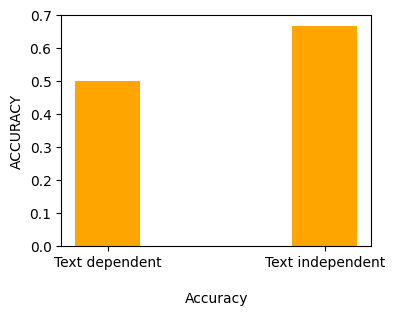

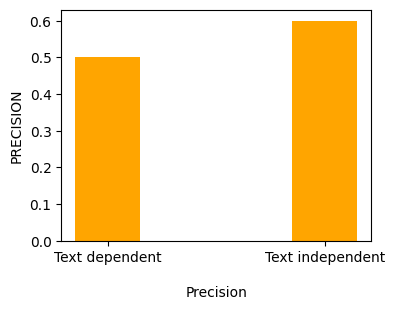

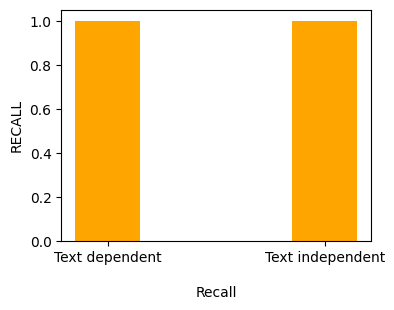

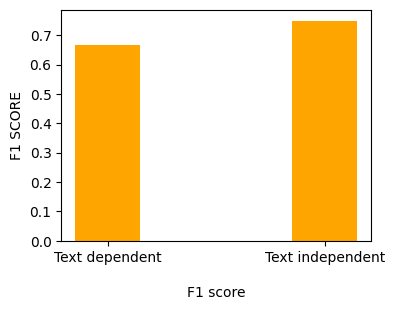

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Define the data
acc = [acc2, acc1]
x = np.arange(2)

# Create the plot
fig, ax = plt.subplots(figsize=(4, 3))  # Set the figure size
ax.bar(x, acc, width=0.3, tick_label=["Text dependent", "Text independent"], color='orange')
ax.set_xlabel('\nAccuracy', fontsize=10)  # Set the x-axis label font size
ax.set_ylabel('ACCURACY', fontsize=10)  # Set the y-axis label font size
ax.tick_params(axis='both', labelsize=10)  # Set the tick label font size

plt.show()




# Define the data
precision = [precision2, precision1]
x = np.arange(2)

# Create the plot
fig, ax = plt.subplots(figsize=(4, 3))  # Set the figure size
ax.bar(x, precision, width=0.3, tick_label=["Text dependent", "Text independent"], color='orange')
ax.set_xlabel('\nPrecision', fontsize=10)  # Set the x-axis label font size
ax.set_ylabel('PRECISION', fontsize=10)  # Set the y-axis label font size
ax.tick_params(axis='both', labelsize=10)  # Set the tick label font size

plt.show()


# Define the data
recall= [recall2, recall1]
x = np.arange(2)

# Create the plot
fig, ax = plt.subplots(figsize=(4, 3))  # Set the figure size
ax.bar(x, recall, width=0.3, tick_label=["Text dependent", "Text independent"], color='orange')
ax.set_xlabel('\nRecall', fontsize=10)  # Set the x-axis label font size
ax.set_ylabel('RECALL', fontsize=10)  # Set the y-axis label font size
ax.tick_params(axis='both', labelsize=10)  # Set the tick label font size

plt.show()


# Define the data
f1_score=[f1_score2,f1_score1]
x = np.arange(2)

# Create the plot
fig, ax = plt.subplots(figsize=(4, 3))  # Set the figure size
ax.bar(x, f1_score, width=0.3, tick_label=["Text dependent", "Text independent"], color='orange')
ax.set_xlabel('\nF1 score', fontsize=10)  # Set the x-axis label font size
ax.set_ylabel('F1 SCORE', fontsize=10)  # Set the y-axis label font size
ax.tick_params(axis='both', labelsize=10)  # Set the tick label font size

plt.show()